# House Plant Species Classification 🌿

**Exploring and Classifying House Plants Using ResNet50**

# Importing Libraries

In [1]:
# Standard / utility
import os

# Data science
import numpy as np
import pandas as pd

# Visualization (import matplotlib.pyplot as plt when needed)
import matplotlib.pyplot as plt
import seaborn as sns

# Image handling
from PIL import Image

# ML / Deep learning (prefer tensorflow.keras over standalone keras)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

# Pretrained models (import specific models you will use)
from tensorflow.keras.applications import ResNet50, EfficientNetB0

# Sklearn utilities
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix



2025-09-03 08:47:25.446297: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756889245.787451      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756889245.884145      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
import tensorflow as tf

# --- List available physical devices ---
gpus = tf.config.list_physical_devices('GPU')
print("Available GPUs:", gpus)

# --- Check if TensorFlow is using GPU ---
if tf.test.gpu_device_name():
    print("✅ GPU is being used by TensorFlow:", tf.test.gpu_device_name())
else:
    print("❌ No GPU detected. TensorFlow is using CPU.")

# --- Extra: Get detailed log info ---
from tensorflow.python.client import device_lib
print("\nAll devices detected by TensorFlow:")
print(device_lib.list_local_devices())


Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
✅ GPU is being used by TensorFlow: /device:GPU:0

All devices detected by TensorFlow:
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7915344320094331708
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14619377664
locality {
  bus_id: 1
  links {
    link {
      device_id: 1
      type: "StreamExecutor"
      strength: 1
    }
  }
}
incarnation: 3039718302121502786
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
, name: "/device:GPU:1"
device_type: "GPU"
memory_limit: 14619377664
locality {
  bus_id: 1
  links {
    link {
      type: "StreamExecutor"
      strength: 1
    }
  }
}
incarnation: 12790366935870367796
physical_device_desc: "device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, com

I0000 00:00:1756889262.845072      36 gpu_device.cc:2022] Created device /device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756889262.845887      36 gpu_device.cc:2022] Created device /device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1756889262.848570      36 gpu_device.cc:2022] Created device /device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756889262.848794      36 gpu_device.cc:2022] Created device /device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1756889262.851038      36 gpu_device.cc:2022] Created device /device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756889262.851242      36 gpu_device.c

# Reading Data

In [3]:
# Load species from Data folder (subfolders as classes)
import os

data_dir = os.path.join(os.getcwd(), "/kaggle/input/plants-data/Data")
species = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
print(f"Found {len(species)} classes.")

Found 24 classes.


In [4]:
species

['Amla',
 'Arali',
 'Ashoka',
 'Ashwagandha',
 'Avacado',
 'Bamboo',
 'Basale',
 'Castor',
 'Corn',
 'Curry_Leaf',
 'Doddapatre',
 'Ganike',
 'Guava',
 'Henna',
 'Mint',
 'Nooni',
 'Pappaya',
 'Rose',
 'Wood_sorel',
 'aloevera',
 'banana',
 'mango',
 'orange',
 'watermelon']

In [5]:
# Load images from Data folder
species_images = {}
valid_exts = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')

for specie in species:
    class_dir = os.path.join(data_dir, specie)
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(valid_exts)]
    species_images[specie] = images

In [6]:
for specie in species_images:
    print(f"Dataset contains {len(species_images[specie])} images of {specie}")

Dataset contains 146 images of Amla
Dataset contains 146 images of Arali
Dataset contains 146 images of Ashoka
Dataset contains 146 images of Ashwagandha
Dataset contains 146 images of Avacado
Dataset contains 146 images of Bamboo
Dataset contains 146 images of Basale
Dataset contains 160 images of Castor
Dataset contains 291 images of Corn
Dataset contains 146 images of Curry_Leaf
Dataset contains 146 images of Doddapatre
Dataset contains 115 images of Ganike
Dataset contains 414 images of Guava
Dataset contains 150 images of Henna
Dataset contains 153 images of Mint
Dataset contains 146 images of Nooni
Dataset contains 146 images of Pappaya
Dataset contains 168 images of Rose
Dataset contains 146 images of Wood_sorel
Dataset contains 200 images of aloevera
Dataset contains 200 images of banana
Dataset contains 200 images of mango
Dataset contains 200 images of orange
Dataset contains 200 images of watermelon


In [7]:
df = pd.DataFrame({
    "species": [k for k, li in species_images.items() for image in li],
    "image": [image for k, li in species_images.items() for image in li]
})
df["image_path"] = df.apply(lambda r: os.path.join(data_dir, r["species"], r["image"]), axis=1)

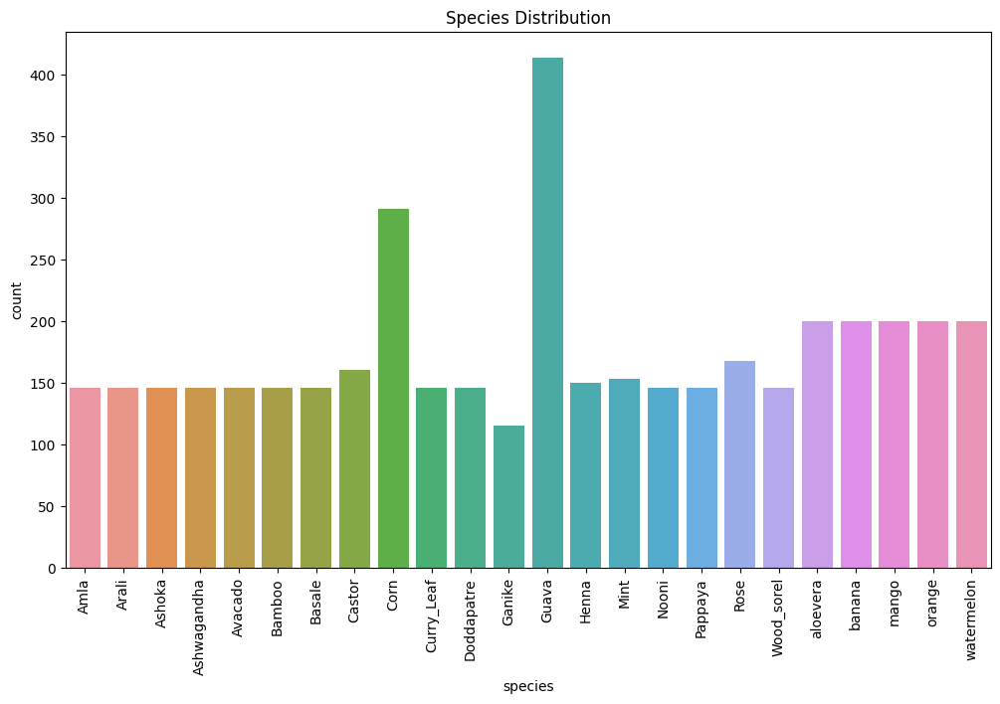

In [8]:
plt.figure(figsize=(12,7))
sns.countplot(df, x='species')
plt.xticks(rotation=90)
plt.title("Species Distribution")
plt.show()

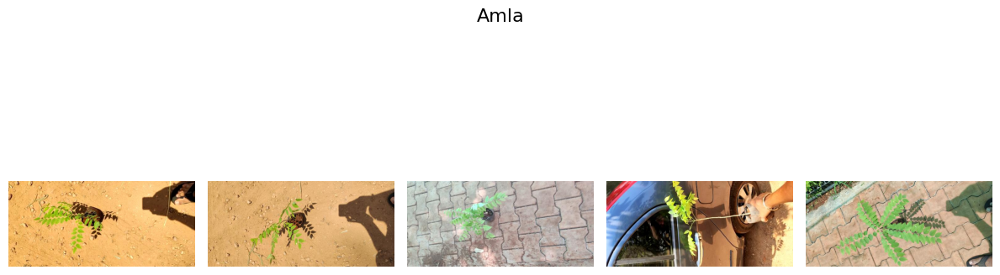

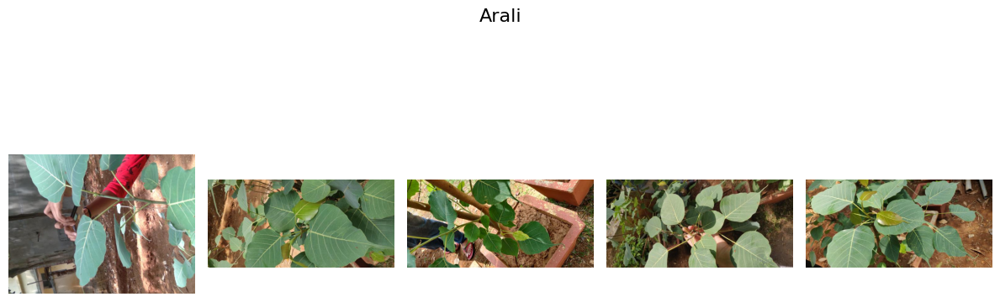

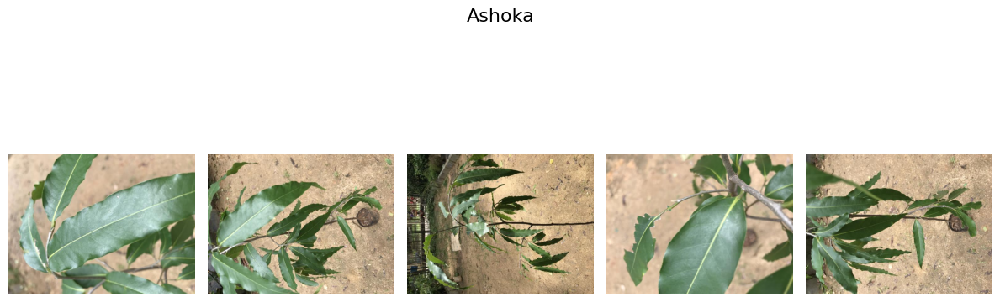

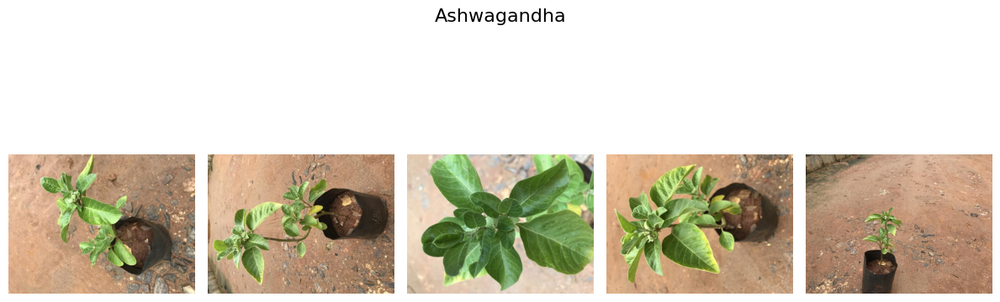

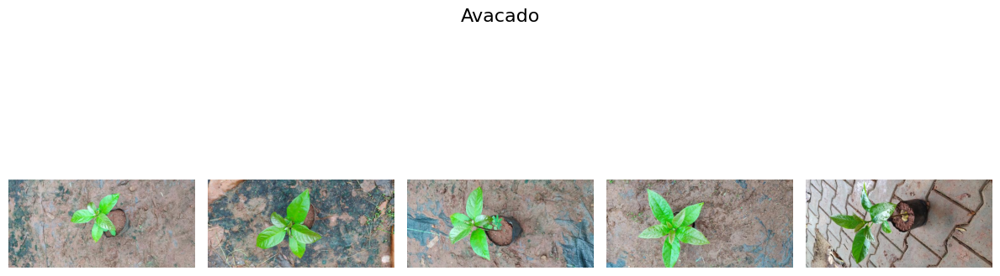

...

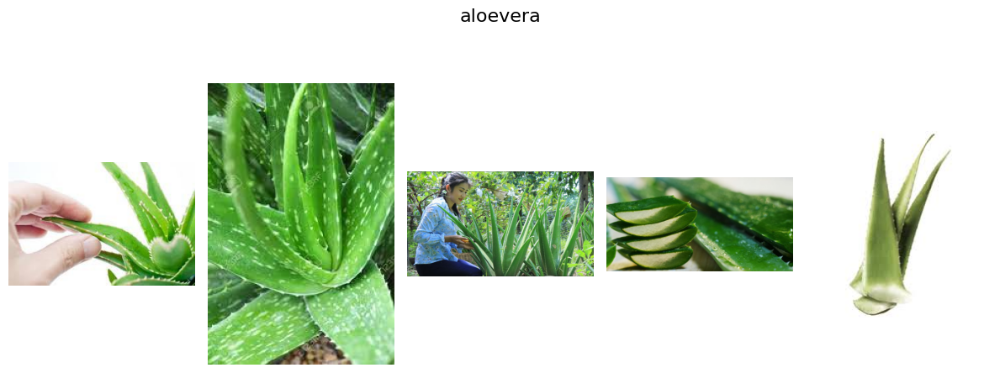

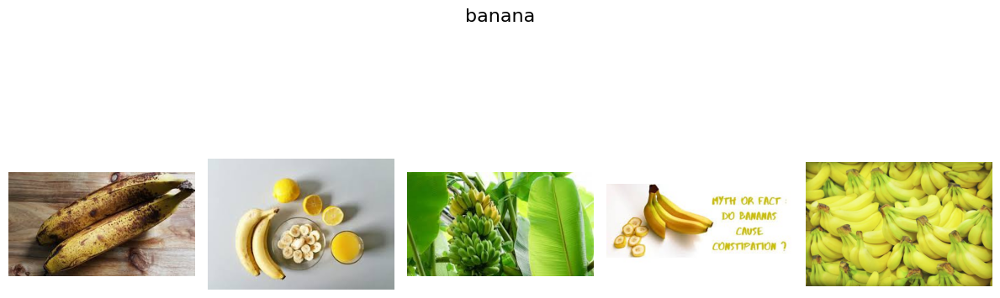

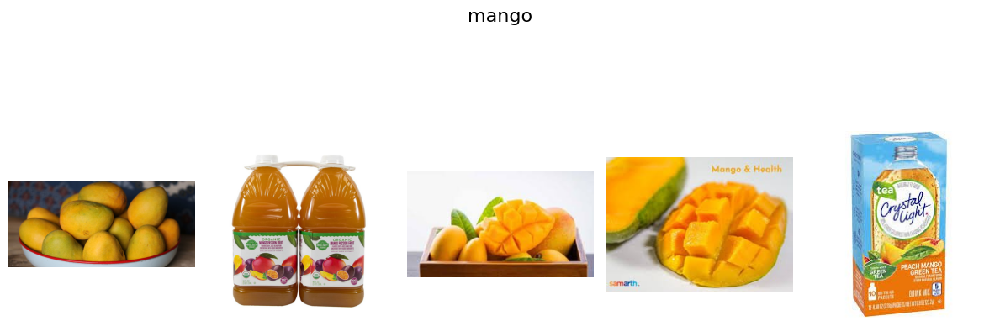

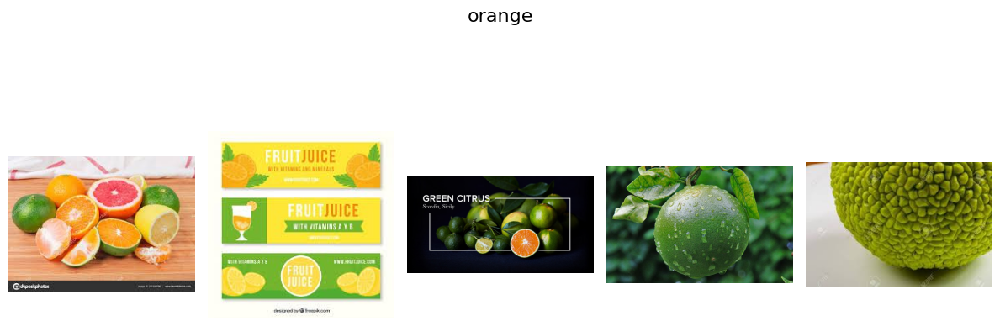

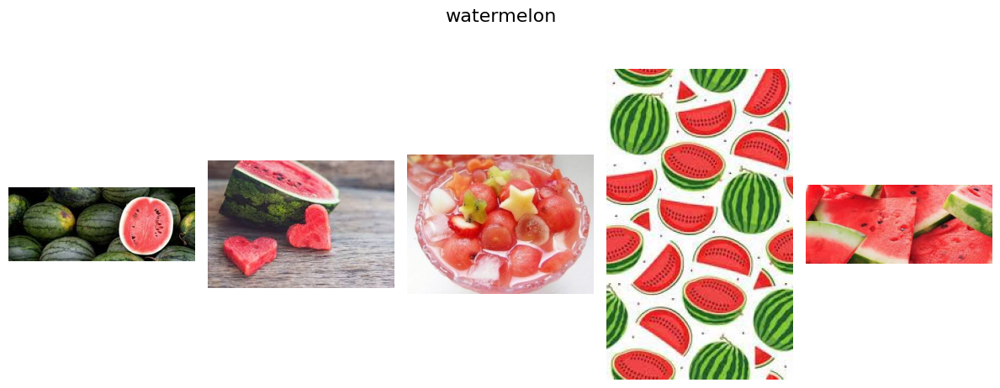

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

for specie in species_images:
    total_len = len(species_images[specie])
    if total_len == 0:
        continue
    random_nos = np.random.randint(0, total_len, 5)

    fig, axes = plt.subplots(1, 5, figsize=(12, 5))
    fig.suptitle(f"{specie}", fontsize=16)

    for i, no in enumerate(random_nos):
        image_name = species_images[specie][no]
        image = Image.open(os.path.join(data_dir, specie, image_name))
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


# Building Image Generator, Preprocessing and Augmentation

In [10]:
# image_path already points to Data/ subfolders; ensure files exist
import os

df = df[df["image_path"].apply(os.path.exists)].reset_index(drop=True)
print(f"Total images found: {len(df)}")

Total images found: 4203


In [16]:
# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [17]:
# We will use validation_split in generators; no manual split is needed here.
# Keeping df for EDA only.

In [18]:
# Parameters
image_size = (224, 224)
batch_size = 8  # Increased batch size for faster training with larger dataset
initial_learning_rate = 0.001  # Initial learning rate

In [19]:
# Use subfolders in Data/ as class labels and create train/val splits
import os

data_dir = os.path.join(os.getcwd(), "/kaggle/input/plants-data/Data")
print("Data directory:", data_dir)

# ImageDataGenerator for training with augmentation + validation split
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
)

# ImageDataGenerator for validation without augmentation (same split)
val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    validation_split=0.2,
)

# Create the train dataset from directory (with augmentations)
train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42,
)

# Create the validation dataset from directory (without augmentations)
val_generator = val_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42,
)

Data directory: /kaggle/input/plants-data/Data
Found 3367 images belonging to 24 classes.
Found 836 images belonging to 24 classes.


In [20]:
print(train_generator.class_indices)

{'Amla': 0, 'Arali': 1, 'Ashoka': 2, 'Ashwagandha': 3, 'Avacado': 4, 'Bamboo': 5, 'Basale': 6, 'Castor': 7, 'Corn': 8, 'Curry_Leaf': 9, 'Doddapatre': 10, 'Ganike': 11, 'Guava': 12, 'Henna': 13, 'Mint': 14, 'Nooni': 15, 'Pappaya': 16, 'Rose': 17, 'Wood_sorel': 18, 'aloevera': 19, 'banana': 20, 'mango': 21, 'orange': 22, 'watermelon': 23}


IndexError: index 8 is out of bounds for axis 0 with size 8

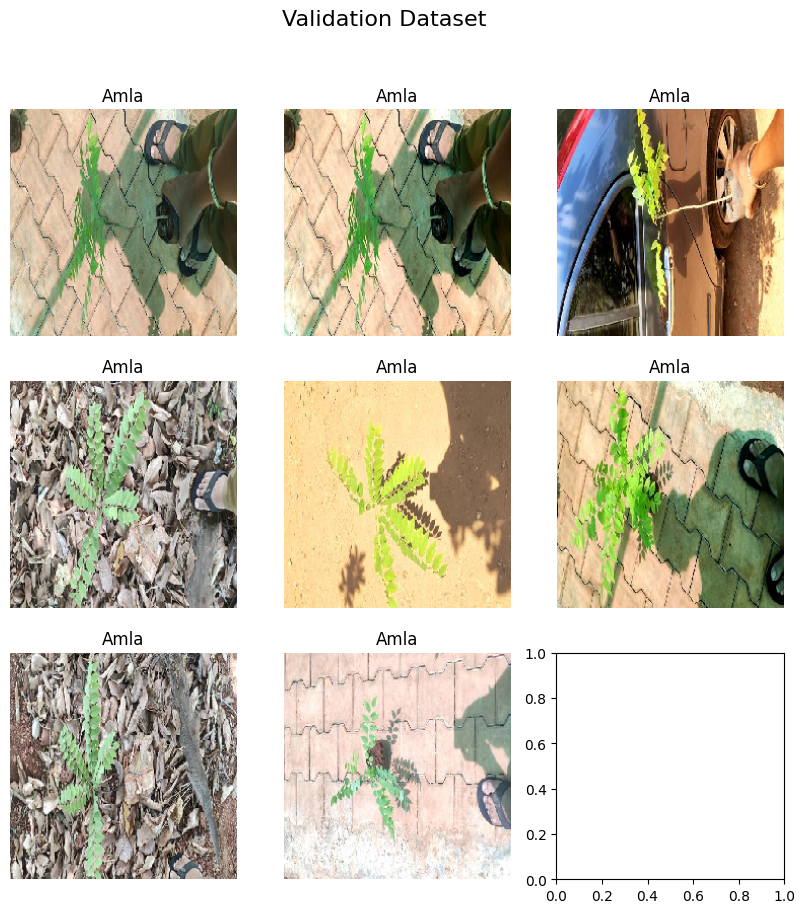

In [21]:
def visualize_augmented_images(generator, suptitle):
    # Get a batch of images from the generator
    images, labels = next(generator)
    label_map = list(generator.class_indices.keys())

    # Create a 3x3 grid to display images
    plt.figure(figsize=(10, 10))
    plt.suptitle(suptitle, fontsize=16)
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.title(label_map[np.argmax(labels[i])])
        plt.imshow(images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_augmented_images(val_generator, "Validation Dataset")
visualize_augmented_images(train_generator, "Train Dataset")

# Building the ResNet50 Model

In [22]:
# Convoluted Base MODEL

conv_base = ResNet50(weights='imagenet',
include_top=False,
input_shape=(224, 224, 3))

I0000 00:00:1756889327.001648      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756889327.001893      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [23]:
# Freeze the base model layers so they are not trainable
# for layer in conv_base.layers:
#     layer.trainable = False

# headModel = conv_base.output
# headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(len(train_generator.class_indices), activation="softmax")(headModel)

# model = Model(inputs=conv_base.input, outputs=headModel)

# model.compile(optimizer=Adam(learning_rate=0.001),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

x = conv_base.output
x = GlobalAveragePooling2D()(x)  # Global Average Pooling to reduce dimensionality
x = Dense(1024, activation='relu')(x)  # Fully connected layer
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)  # Output layer for classification

# Create the complete model
model = Model(inputs=conv_base.input, outputs=predictions)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [24]:
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 25,710,488 (98.08 MB)

 Trainable params: 25,657,368 (97.88 MB)

 Non-trainable params: 53,120 (207.50 KB)

None


# Model Training

In [25]:
# from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# callbacks = [
#     EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),  # Stop training early if val_loss does not improve
#     ModelCheckpoint(filepath='resnet_model.keras', monitor='val_loss', save_best_only=True),  # Save the best model
#     ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)  # Reduce learning rate when val_loss plateaus
# ]

# --- compute class weights ---
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))
print("Class Weights:", class_weights)

# --- callbacks ---
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint(filepath='resnet_model.keras', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)
]


Class Weights: {0: 1.1990740740740742, 1: 1.1990740740740742, 2: 1.1990740740740742, 3: 1.1990740740740742, 4: 1.1990740740740742, 5: 1.1990740740740742, 6: 1.1990740740740742, 7: 1.0960286458333333, 8: 0.602110157367668, 9: 1.1990740740740742, 10: 1.1990740740740742, 11: 1.524909420289855, 12: 0.4225652610441767, 13: 1.1690972222222222, 14: 1.1405826558265582, 15: 1.1990740740740742, 16: 1.1990740740740742, 17: 1.0391975308641976, 18: 1.1990740740740742, 19: 0.8768229166666667, 20: 0.8768229166666667, 21: 0.8768229166666667, 22: 0.8768229166666667, 23: 0.8768229166666667}


In [26]:
# history = model.fit(
#     train_generator,
#     epochs=25,
#     validation_data=val_generator,
#     callbacks=callbacks,
# )

# --- training ---
history = model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=callbacks,
    class_weight=class_weights   # <---- use here
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25


I0000 00:00:1756889397.647480     136 service.cc:148] XLA service 0x798a2c004bc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756889397.649233     136 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1756889397.649272     136 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1756889402.634884     136 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/421 ━━━━━━━━━━━━━━━━━━━━ 9:00:58 77s/step - accuracy: 0.0000e+00 - loss: 3.6504

I0000 00:00:1756889423.381056     136 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


421/421 ━━━━━━━━━━━━━━━━━━━━ 170s 220ms/step - accuracy: 0.2214 - loss: 2.9376 - val_accuracy: 0.0347 - val_loss: 6.3628 - learning_rate: 0.0010
Epoch 2/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - accuracy: 0.4866 - loss: 1.5959 - val_accuracy: 0.2285 - val_loss: 3.1330 - learning_rate: 0.0010
Epoch 3/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - accuracy: 0.6110 - loss: 1.1619 - val_accuracy: 0.1866 - val_loss: 14.1672 - learning_rate: 0.0010
Epoch 4/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - accuracy: 0.6748 - loss: 0.9971 - val_accuracy: 0.4593 - val_loss: 3.1706 - learning_rate: 0.0010
Epoch 5/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - accuracy: 0.7277 - loss: 0.8139 - val_accuracy: 0.7022 - val_loss: 0.9434 - learning_rate: 0.0010
Epoch 6/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - accuracy: 0.7503 - loss: 0.7438 - val_accuracy: 0.7213 - val_loss: 0.9372 - learning_rate: 0.0010
Epoch 7/25
421/421 ━━━━━━━━━━━━━━━━━━━━ 51s 121ms/step - accuracy: 0.7843 - los

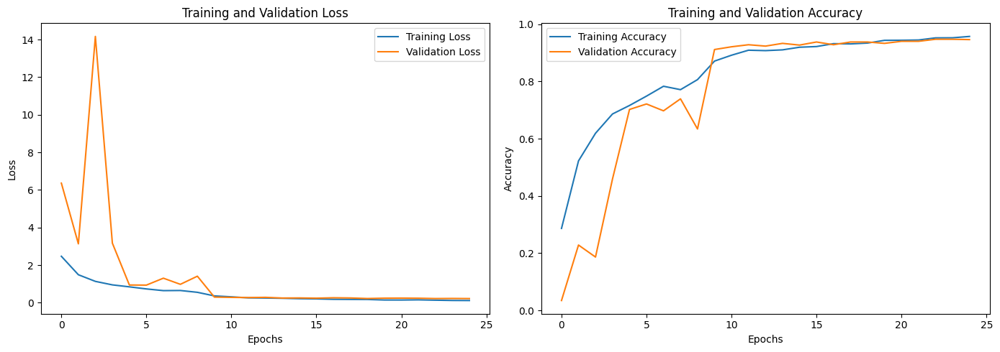

In [27]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluating the Model

105/105 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step


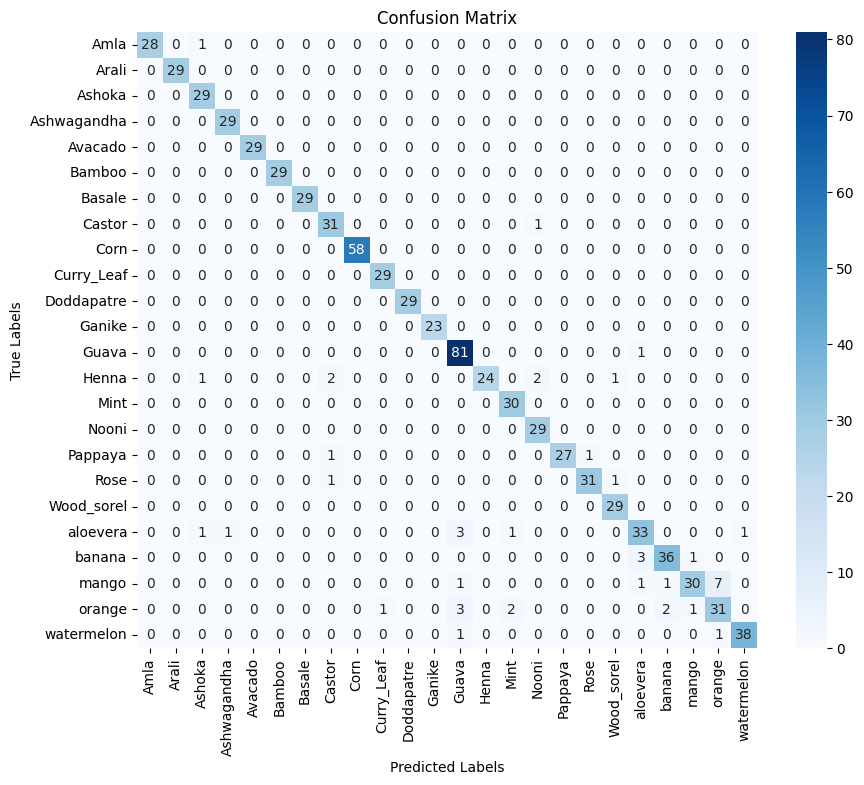

Classification Report:
              precision    recall  f1-score   support

        Amla       1.00      0.97      0.98        29
       Arali       1.00      1.00      1.00        29
      Ashoka       0.91      1.00      0.95        29
 Ashwagandha       0.97      1.00      0.98        29
     Avacado       1.00      1.00      1.00        29
      Bamboo       1.00      1.00      1.00        29
      Basale       1.00      1.00      1.00        29
      Castor       0.89      0.97      0.93        32
        Corn       1.00      1.00      1.00        58
  Curry_Leaf       0.97      1.00      0.98        29
  Doddapatre       1.00      1.00      1.00        29
      Ganike       1.00      1.00      1.00        23
       Guava       0.91      0.99      0.95        82
       Henna       1.00      0.80      0.89        30
        Mint       0.91      1.00      0.95        30
       Nooni       0.91      1.00      0.95        29
     Pappaya       1.00      0.93      0.96        29
    

In [28]:
# 1. Generate predictions from the model
predictions = model.predict(val_generator)
predicted_classes = np.argmax(predictions, axis=1)

# 2. Extract true labels from val_generator
true_classes = val_generator.classes  # This works if you're using ImageDataGenerator
class_labels = list(val_generator.class_indices.keys())  # Get the class labels

# 3. Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

# 4. Classification Report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(report)

In [31]:
model.save('plant_species_Model.h5')

Loaded 24 classes from Data/: ['Amla', 'Arali', 'Ashoka', 'Ashwagandha', 'Avacado', 'Bamboo', 'Basale', 'Castor', 'Corn', 'Curry_Leaf', 'Doddapatre', 'Ganike', 'Guava', 'Henna', 'Mint', 'Nooni', 'Pappaya', 'Rose', 'Wood_sorel', 'aloevera', 'banana', 'mango', 'orange', 'watermelon']
Model loaded: c:\SWAYAMs\PROJ\Plants_Identification\resnet_model_kaggle.keras


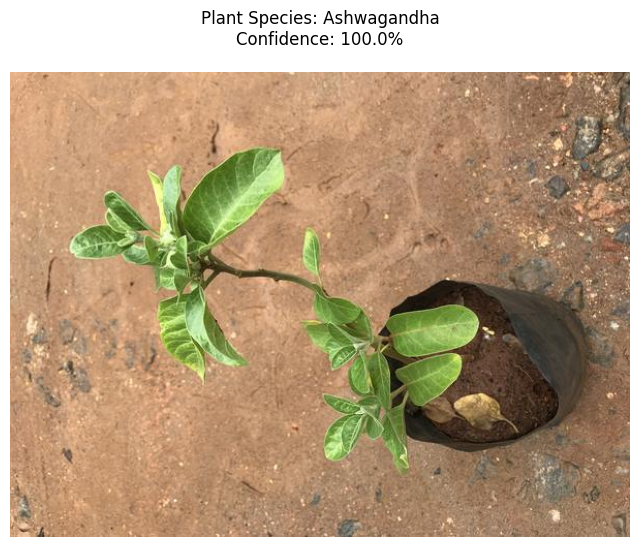


Prediction Results:
Plant Species: Ashwagandha
Confidence: 100.0%


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

# Resolve classes from current Data/ subfolders (sorted like flow_from_directory)
data_dir = os.path.join(os.getcwd(), "C:\SWAYAMs\PROJ\Plants_Identification\Data")
class_names = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
print(f"Loaded {len(class_names)} classes from Data/:", class_names)

# Load the saved model from this project directory
model_path_candidates = [
    os.path.join(os.getcwd(), "resnet_model_kaggle.keras"),
    # os.path.join(os.getcwd(), "plant_species_Model_kaggle.h5"),
]
model = None
for mp in model_path_candidates:
    if os.path.exists(mp):
        try:
            model = load_model(mp)
            print(f"Model loaded: {mp}")
            break
        except Exception as e:
            print(f"Failed to load {mp}: {e}")

if model is None:
    raise FileNotFoundError("No saved model found. Expected one of: resnet_model.keras, plant_species_Model.h5")

# Define image size (match training)
IMG_SIZE = 224


def predict_plant(image_path):
    """Predict class name and confidence for a single image."""
    img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    preds = model.predict(img_array, verbose=0)[0]
    idx = int(np.argmax(preds))
    return class_names[idx], float(preds[idx])


# Get image path from user
image_path = input("Enter the path to your plant image: ")

if os.path.exists(image_path):
    predicted_class, confidence = predict_plant(image_path)

    # Display the image with prediction
    plt.figure(figsize=(8, 8))
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Plant Species: {predicted_class}\nConfidence: {confidence:.1%}', pad=20)
    plt.show()

    print("\nPrediction Results:")
    print(f"Plant Species: {predicted_class}")
    print(f"Confidence: {confidence:.1%}")
else:
    print("Error: Image file not found. Please check the path and try again.")